# Mariupol Building Destruction Detection via SAR Coherence

## Overview
Referenced from
> **Räcke & Keil (2024)** — *Detecting destruction from public satellite images using SAR coherence*
---

### Key dates
| Event | Date |
|-------|------|
| Russia's full-scale invasion of Ukraine | 24 Feb 2022 |
| Siege of Mariupol begins | 24 Feb 2022 |
| Mariupol falls under Russian control | ~20 May 2022 |
| UNOSAT damage assessment snapshot | 12 May 2022 |
| First war-period coherence pair in dataset | 2022-02-16 – 2022-02-28 |
| Last coherence pair in dataset | 2022-06-28 – 2022-07-10 |

### How SAR coherence detects destruction
Coherence measures the correlation between two SAR acquisitions over the same area.
Buildings and hard structures maintain **high coherence** (~0.7–0.9) over time.
When a building is **destroyed**, the surface changes dramatically → coherence **drops** sharply.
We model the expected coherence trend for each pixel, compute residuals, and flag
statistically significant drops using a one-sided p-value (left tail under Normal(0, Qn)).

### Dataset files used
- `mariupol_full_coherence_df.rds` — pre-extracted pixel coherence time series
- `mariupol_full_coherence_df_reg_results_1stdifferences_lambda_10.rds` — pre-fitted median regression
- `building_footprint_center_shp_upd.rds` — OSM building footprints (no overlaps) + UNOSAT damage
- `building_footprint_center_shp_overlaps_upd.rds` — OSM building footprints (with overlaps) + UNOSAT damage
- `pixel_alignment_df.rds` — pixel → building mapping (no overlaps)
- `pixel_alignment_df_overlaps.rds` — pixel → building mapping (with overlaps)
- `UNOSAT_Mariupol_Livoberezhyny_DA_12May2022.shp` — UNOSAT damage points

In [8]:
# Install required packages
!pip install pyreadr rasterio geopandas scipy statsmodels scikit-learn matplotlib seaborn pyproj shapely rioxarray -q

## Setup(Dataset-extraction)

In [9]:
import os

BASE_DATA     = '/kaggle/input/datasets/ae22b036/cv5600-mariupol-dataset/Mariupol'
COHERENCE_DIR = os.path.join(BASE_DATA, 'Coherence_Maps_Mariupol')
UNOSAT_DIR    = os.path.join(BASE_DATA, 'UNOSAT_LivoberezhnyiDistrict_DamageAssessment_12May2022_shp')
RESULTS_DIR   = '/kaggle/working/results/Mariupol'

for sub in ['performance_datasets','performance','density_plots','spatial_maps','combined_spatial_maps']:
    os.makedirs(os.path.join(RESULTS_DIR, sub), exist_ok=True)

# Check every key file
key_files = [
    'building_footprint_center_shp_upd.rds',
    'building_footprint_center_shp_overlaps_upd.rds',
    'pixel_alignment_df.rds',
    'pixel_alignment_df_overlaps.rds',
    'mariupol_full_coherence_df.rds',
    'mariupol_full_coherence_df_reg_results_1stdifferences_lambda_10.rds',
    'mariupol_dates_df.rds',
    'mariupol_center_district.rds',
    'mariupol_center.shp',
]
for f in key_files:
    full = os.path.join(BASE_DATA, f)
    status = '' if os.path.exists(full) else ' MISSING'
    print(f'{status}  {f}')

# Coherence maps
n_coh = len([f for f in os.listdir(COHERENCE_DIR) if f.endswith('.tif')])
print(f'\n  Coherence .tif files: {n_coh}  (expected 24)')

  building_footprint_center_shp_upd.rds
  building_footprint_center_shp_overlaps_upd.rds
  pixel_alignment_df.rds
  pixel_alignment_df_overlaps.rds
  mariupol_full_coherence_df.rds
  mariupol_full_coherence_df_reg_results_1stdifferences_lambda_10.rds
  mariupol_dates_df.rds
  mariupol_center_district.rds
  mariupol_center.shp

  Coherence .tif files: 24  (expected 24)


## Imports & Helper Functions

In [10]:
import os, re, gc, warnings
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from scipy.stats import norm, gaussian_kde
from scipy.spatial.distance import pdist
import rasterio
from rasterio.enums import Resampling
from rasterio.warp import reproject, calculate_default_transform
import pyreadr
from shapely.geometry import box
from joblib import Parallel, delayed
import statsmodels.formula.api as smf

warnings.filterwarnings('ignore')

def increase_size_bbox(bounds, percent=0.01):
    minx, miny, maxx, maxy = bounds
    dx = (maxx - minx) * percent or percent
    dy = (maxy - miny) * percent or percent
    return (minx - dx, miny - dy, maxx + dx, maxy + dy)

def match_damage_to_buildings(damage_gdf, buildings_gdf):
    if buildings_gdf.crs != damage_gdf.crs:
        damage_gdf = damage_gdf.to_crs(buildings_gdf.crs)
    bldgs = buildings_gdf.copy().reset_index(drop=True)
    bldgs['building_id'] = bldgs.index + 1   
    joined = gpd.sjoin(bldgs[['building_id','geometry']],
                       damage_gdf[['d_Main_Dam','geometry']],
                       how='left', predicate='intersects')
    damage_map = {'Destroyed':1,'Severe Damage':2,'Moderate Damage':3,
                  'Possible Damage':4,'No Visible Damage':5}
    joined['Dam2'] = joined['d_Main_Dam'].map(damage_map).astype(float)
    agg = joined.groupby('building_id')['Dam2'].min().reset_index()
    return bldgs.merge(agg, on='building_id', how='left')

def qn_scale(x, c=2.2219):
    """
    Computes the Rousseeuw and Croux (1993) Qn robust estimator of scale.
    """
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = len(x)
    if n < 2:
        return 0.0
    if n % 2 == 1:   # odd
        c_n = c * n / (n + 1.4)
    else:             # even
        c_n = c * n / (n + 3.8)

    # All pairwise absolute differences (cityblock = L1 = absolute diff for 1D)
    diffs = pdist(x.reshape(-1, 1), metric='cityblock')

    h = int(np.floor(n / 2)) + 1
    k = h * (h - 1) // 2

    # k-th order statistic (0-based index is k-1); np.partition is O(N)
    qn_val = c_n * np.partition(diffs, k - 1)[k - 1]

    return float(qn_val)

def harmonic_mean_pvalue(pvalues, weights):
    """(Wilson 2019 HMP method).
    p_B = w / (w/p)  — handles positive spatial dependence correctly."""
    pv = np.asarray(pvalues, dtype=float)
    w  = np.asarray(weights, dtype=float)
    # Mask: skip NaN weights, NaN p-values, zero/negative weights, AND p==0 (underflow)
    mask = ~(np.isnan(pv) | np.isnan(w) | (w <= 0) | (pv <= 0))
    if mask.sum() == 0:
        return np.nan
    return np.sum(w[mask]) / np.sum(w[mask] / pv[mask])

def calc_auc(x, y):
    x, y = np.array(x, float), np.array(y, float)
    order = np.argsort(x)
    return float(np.trapz(y[order], x[order]))

def pr_envelope(df, recall_col='recall', prec_col='precision'):
    return (df.groupby(recall_col, as_index=False)[prec_col]
              .max().sort_values(recall_col).reset_index(drop=True))

def roc_envelope(df, fpr_col='fpr', tpr_col='tpr'):
    return (df.groupby(fpr_col, as_index=False)[tpr_col]
              .max().sort_values(fpr_col).reset_index(drop=True))

print('imports and helper functions loaded.')

imports and helper functions loaded.


## Load Building Footprints

In [11]:
#   building_footprint_center_shp_upd.rds  (n=10650):
#     Dam2  @ byte 170447  — float64 big-endian; unique=[1,2,3,4]; count(1.0)=93 
#   building_footprint_center_shp_overlaps_upd.rds  (n=10984):
#     Dam2  @ byte 4237807 — float64 big-endian; unique=[1,2,3,4]; count(1.0)=93 
#   pixel_alignment_df.rds  (n=73810):
#     r           @ byte 31       (1-based row index, 1..373)
#     c           @ byte 590519   (1-based col index, 1..579)
#     building_id @ byte 1181007  (1-based building id, 1..10649)
#     weight      @ byte 1771495  (0.01..1.0)

import gzip
import numpy as np
import pandas as pd

def read_rds_floats(rds_path, byte_offset, n):
    """Read n big-endian float64 values from a gzip .rds at byte_offset
    (offset into decompressed stream, after the 4-byte SEXP header + 4-byte length word)."""
    with gzip.open(rds_path) as f:
        raw = f.read()
    start = byte_offset + 8          # +4 flags word, +4 length word
    return np.frombuffer(raw[start : start + n*8], dtype=">f8").astype(np.float64)

BF_NO_OV_PATH = os.path.join(BASE_DATA, "building_footprint_center_shp_upd.rds")
BF_OV_PATH    = os.path.join(BASE_DATA, "building_footprint_center_shp_overlaps_upd.rds")
PIX_PATH      = os.path.join(BASE_DATA, "pixel_alignment_df.rds")

#  No-overlap building footprint 
N_NO_OV  = 10650
dam2_no  = read_rds_floats(BF_NO_OV_PATH, 170447, N_NO_OV)
bf_no_ov = pd.DataFrame({
    "building_id": np.arange(1, N_NO_OV + 1),   
    "Dam2":        dam2_no
})
print(f"bf_no_ov: {len(bf_no_ov):,} buildings")
print(f"  Destroyed (Dam2=1): {(bf_no_ov['Dam2']==1).sum()}   target: 93")
print(bf_no_ov["Dam2"].value_counts(dropna=False).sort_index())

#  Overlaps building footprint 
N_OV     = 10984
dam2_ov  = read_rds_floats(BF_OV_PATH, 4237807, N_OV)
bf_ov    = pd.DataFrame({
    "building_id": np.arange(1, N_OV + 1),
    "Dam2":        dam2_ov
})
print(f"\nbf_ov: {len(bf_ov):,} buildings")
print(f"  Destroyed (Dam2=1): {(bf_ov['Dam2']==1).sum()}")
print(bf_ov["Dam2"].value_counts(dropna=False).sort_index())

#  pixel_alignment_df (no-overlap) 
N_PIX = 73810
pixel_alignment_df = pd.DataFrame({
    "r":           read_rds_floats(PIX_PATH, 31,       N_PIX),
    "c":           read_rds_floats(PIX_PATH, 590519,   N_PIX),
    "building_id": read_rds_floats(PIX_PATH, 1181007,  N_PIX),
    "weight":      read_rds_floats(PIX_PATH, 1771495,  N_PIX),
}).dropna().astype({"r": int, "c": int, "building_id": int})
print(f"\npixel_alignment_df: {len(pixel_alignment_df):,} rows")
print(f"  r=[{pixel_alignment_df.r.min()},{pixel_alignment_df.r.max()}]  "
      f"c=[{pixel_alignment_df.c.min()},{pixel_alignment_df.c.max()}]")
print(f"  building_id=[{pixel_alignment_df.building_id.min()},"
      f"{pixel_alignment_df.building_id.max()}]  weight=[{pixel_alignment_df.weight.min():.3f},"
      f"{pixel_alignment_df.weight.max():.3f}]")

#  Sanity check: pixels → Destroyed buildings 
merged_chk  = pixel_alignment_df.merge(bf_no_ov, on="building_id", how="left")
pix_summary = merged_chk.groupby(["r","c"])["Dam2"].min().reset_index()
n_destroyed_pix = (pix_summary["Dam2"] == 1).sum()
print(f"\n  Pixels mapped to Destroyed buildings: {n_destroyed_pix}")

bf_no_ov_raw = bf_no_ov   # alias: no-overlap building footprint DataFrame
bf_ov_raw    = bf_ov      # alias: overlaps building footprint DataFrame

bf_no_ov: 10,650 buildings
  Destroyed (Dam2=1): 93   target: 93
Dam2
1.0      93
2.0     552
3.0    1031
4.0      73
NaN    8901
Name: count, dtype: int64

bf_ov: 10,984 buildings
  Destroyed (Dam2=1): 93
Dam2
1.0      93
2.0     555
3.0    1048
4.0      74
NaN    9214
Name: count, dtype: int64

pixel_alignment_df: 73,809 rows
  r=[1,373]  c=[1,579]
  building_id=[1,10649]  weight=[0.010,1.000]

  Pixels mapped to Destroyed buildings: 456


## UNOSAT Ground Truth & Coherence Dates

In [12]:
#  UNOSAT damage assessment 
ground_truth_map = gpd.read_file(
    os.path.join(UNOSAT_DIR, 'UNOSAT_Mariupol_Livoberezhyny_DA_12May2022.shp')
)
ground_truth_map = ground_truth_map[
    ~ground_truth_map['d_SiteID'].isin(['Field','Road'])
].copy()

gdf_4326 = ground_truth_map.to_crs(epsg=4326)
ground_truth_map['longitude'] = gdf_4326.geometry.x
ground_truth_map['latitude']  = gdf_4326.geometry.y
ground_truth_map = ground_truth_map.to_crs(epsg=32637)
ground_truth_map['d_Main_Dam'] = ground_truth_map['d_Main_Dam'].astype('category')

print(f'Total UNOSAT assessment points: {len(ground_truth_map)}')
print(ground_truth_map['d_Main_Dam'].value_counts())

center_points        = ground_truth_map[ground_truth_map['longitude'] <  37.6].copy()
livoberezhnyi_points = ground_truth_map[ground_truth_map['longitude'] >= 37.6].copy()
print(f'\nCenter district:       {len(center_points)} points')
print(f'Livoberezhnyi district: {len(livoberezhnyi_points)} points')

#  Coherence date index 
dates_rds = os.path.join(BASE_DATA, 'mariupol_dates_df.rds')
if os.path.exists(dates_rds):
    dates_df = pyreadr.read_r(dates_rds)[None]
    dates_df['first_date'] = pd.to_datetime(dates_df['first_date'])
    dates_df['last_date']  = pd.to_datetime(dates_df['last_date'])
    dates_df['time_point'] = dates_df['time_point'].astype(int)
else:
    # Reconstruct from .tif filenames
    files = sorted(f for f in os.listdir(COHERENCE_DIR) if f.endswith('.tif'))
    recs = []
    for f in files:
        m = re.search(r'cor_(\d{8})vs(\d{8})', f)
        if m:
            recs.append({'first_date': pd.to_datetime(m.group(1), format='%Y%m%d'),
                         'last_date':  pd.to_datetime(m.group(2), format='%Y%m%d')})
    dates_df = pd.DataFrame(recs)
    dates_df['time_point'] = range(1, len(dates_df)+1)

dates_df['label'] = (dates_df['first_date'].dt.strftime('%Y-%m-%d') + ' – ' +
                     dates_df['last_date'].dt.strftime('%Y-%m-%d'))
print('\nCoherence time series:')
print(dates_df[['time_point','label']].to_string(index=False))

Total UNOSAT assessment points: 5643
d_Main_Dam
No Visible Damage    4903
Moderate Damage       311
Severe Damage         300
Possible Damage        68
Destroyed              61
Name: count, dtype: int64

Center district:       2907 points
Livoberezhnyi district: 2736 points

Coherence time series:
 time_point                   label
          1 2021-10-07 – 2021-10-19
          2 2021-10-19 – 2021-10-31
          3 2021-10-31 – 2021-11-12
          4 2021-11-12 – 2021-11-24
          5 2021-11-24 – 2021-12-06
          6 2021-12-06 – 2021-12-18
          7 2021-12-18 – 2021-12-30
          8 2021-12-30 – 2022-01-11
          9 2022-01-11 – 2022-01-23
         10 2022-01-23 – 2022-02-04
         11 2022-02-04 – 2022-02-16
         12 2022-02-16 – 2022-02-28
         13 2022-02-28 – 2022-03-12
         14 2022-03-12 – 2022-03-24
         15 2022-03-24 – 2022-04-05
         16 2022-04-05 – 2022-04-17
         17 2022-04-17 – 2022-04-29
         18 2022-04-29 – 2022-05-11
         19 2022

## UNOSAT Damage Map

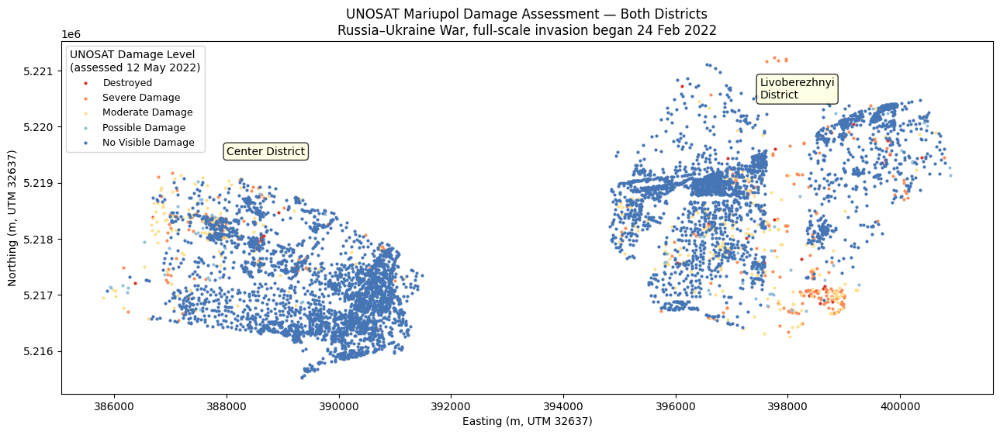

In [13]:
damage_palette = {
    'Destroyed':         '#d73027',
    'Severe Damage':     '#fc8d59',
    'Moderate Damage':   '#fee08b',
    'Possible Damage':   '#91bfdb',
    'No Visible Damage': '#4575b4',
}
gt_plot = ground_truth_map.copy()
gt_plot['d_Main_Dam'] = gt_plot['d_Main_Dam'].astype(str)

fig, ax = plt.subplots(figsize=(13, 8))
for label, color in damage_palette.items():
    sub = gt_plot[gt_plot['d_Main_Dam'] == label]
    if len(sub):
        sub.plot(ax=ax, color=color, markersize=4, label=label)

ax.legend(title='UNOSAT Damage Level\n(assessed 12 May 2022)', loc='upper left', fontsize=9)
ax.set_title('UNOSAT Mariupol Damage Assessment — Both Districts\n'
             'Russia–Ukraine War, full-scale invasion began 24 Feb 2022', fontsize=12)
ax.set_xlabel('Easting (m, UTM 32637)')
ax.set_ylabel('Northing (m, UTM 32637)')

ax.annotate('Center District', xy=(388000, 5219500), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='lightyellow', alpha=0.8))
ax.annotate('Livoberezhnyi\nDistrict', xy=(397500, 5220500), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='lightyellow', alpha=0.8))

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'ground_truth_map.png'), dpi=150, bbox_inches='tight')
plt.show()

## SAR Coherence Time Series Overview
War period begins at time_point 13 (2022-02-16). Time points 7 & 8 are faulty and excluded.

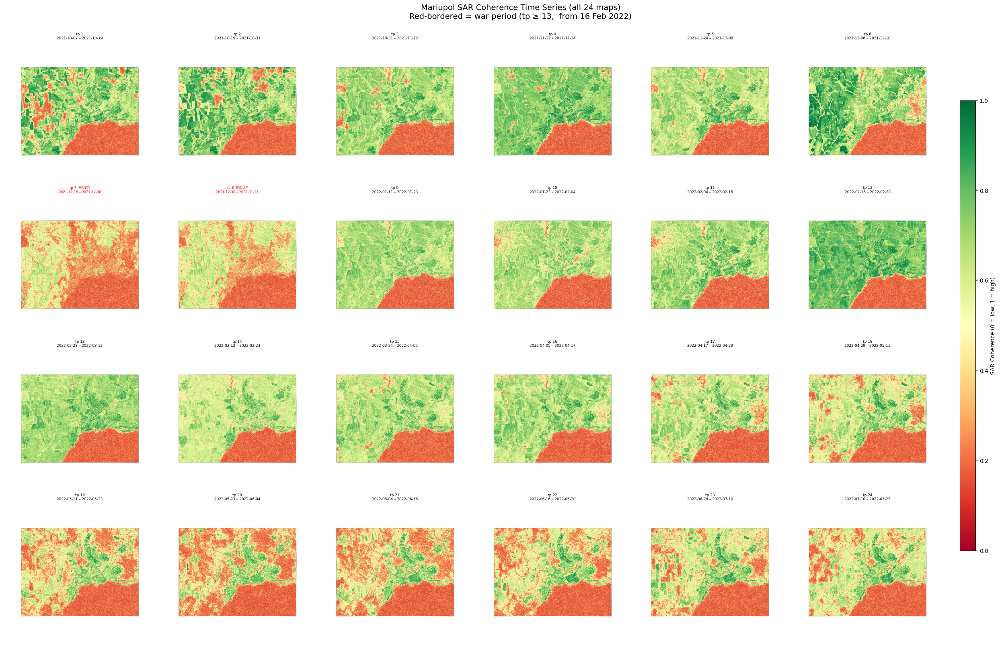

In [14]:
files_sorted = sorted(f for f in os.listdir(COHERENCE_DIR) if f.endswith('.tif'))

fig, axes = plt.subplots(4, 6, figsize=(26, 16))
axes_flat = axes.flatten()

for idx, fname in enumerate(files_sorted):
    tp = idx + 1
    ax = axes_flat[idx]
    with rasterio.open(os.path.join(COHERENCE_DIR, fname)) as src:
        data = src.read(1).astype(float)
        data[data == src.nodata] = np.nan if src.nodata else data

    label_row = dates_df[dates_df['time_point'] == tp]['label']
    title_str = label_row.values[0] if len(label_row) else f'tp {tp}'

    im = ax.imshow(data, cmap='RdYlGn', vmin=0, vmax=1, aspect='auto')
    ax.set_title(f'tp {tp}\n{title_str}', fontsize=6.5)
    ax.axis('off')

    # Highlight war period
    if tp >= 13:
        for spine in ax.spines.values():
            spine.set_edgecolor('#d73027')
            spine.set_linewidth(2.5)
            spine.set_visible(True)
    if tp in [7, 8]:
        ax.set_title(f'tp {tp}  FAULTY\n{title_str}', fontsize=6, color='red')

cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax, label='SAR Coherence (0 = low, 1 = high)')

fig.suptitle('Mariupol SAR Coherence Time Series (all 24 maps)\n'
             'Red-bordered = war period (tp ≥ 13,  from 16 Feb 2022)', fontsize=14, y=1.00)
plt.tight_layout(rect=[0, 0, 0.91, 1])
plt.savefig(os.path.join(RESULTS_DIR, 'coherence_all_maps_grid.png'), dpi=120, bbox_inches='tight')
plt.show()

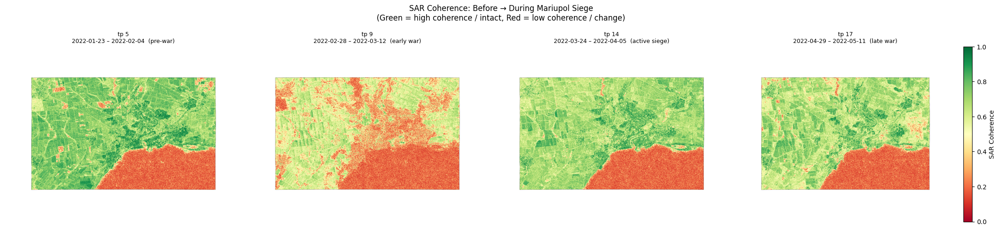

In [15]:
#  Coherence before vs. during war 
# tp 5 = last clear pre-war pair; tp 14 = peak destruction period
compare_tps = [
    (5,  '2022-01-23 – 2022-02-04  (pre-war)'),
    (9,  '2022-02-28 – 2022-03-12  (early war)'),
    (14, '2022-03-24 – 2022-04-05  (active siege)'),
    (17, '2022-04-29 – 2022-05-11  (late war)'),
]

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
for ax, (tp, title) in zip(axes, compare_tps):
    fname = [f for f in files_sorted if tp == files_sorted.index(f)+1]
    row = dates_df[dates_df['time_point'] == tp]
    if len(row):
        d1 = row['first_date'].values[0]
        d1_str = pd.Timestamp(d1).strftime('%Y%m%d')
        match = [f for f in files_sorted if d1_str in f]
        if match:
            with rasterio.open(os.path.join(COHERENCE_DIR, match[0])) as src:
                data = src.read(1).astype(float)
            im = ax.imshow(data, cmap='RdYlGn', vmin=0, vmax=1, aspect='auto')
            ax.set_title(f'tp {tp}\n{title}', fontsize=9)
            ax.axis('off')

plt.colorbar(im, ax=axes[-1], fraction=0.046, pad=0.04, label='SAR Coherence')
fig.suptitle('SAR Coherence: Before → During Mariupol Siege\n'
             '(Green = high coherence / intact, Red = low coherence / change)', fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'coherence_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

## Load Pre-computed Regression Results

In [16]:
LAMBDA = 10
path_label = f'differences_lambda_{LAMBDA}'

# Raw coherence time series (used only for overview, not performance analysis)
full_coherence_df = pyreadr.read_r(
    os.path.join(BASE_DATA, 'mariupol_full_coherence_df.rds')
)[None]
print(f'Raw coherence df:     {full_coherence_df.shape}  (rows = pixels × time_points)')

# Pre-computed regression residuals — this is what scripts 03 & 04 actually use
reg_path = os.path.join(BASE_DATA,
    f'mariupol_full_coherence_df_reg_results_1stdifferences_lambda_{LAMBDA}.rds')
full_coherence_df_reg = pyreadr.read_r(reg_path)[None]
print(f'Regression results:   {full_coherence_df_reg.shape}')
print(f'Columns: {list(full_coherence_df_reg.columns)}')
print(full_coherence_df_reg.head())

Raw coherence df:     (5183208, 4)  (rows = pixels × time_points)
Regression results:   (4535307, 9)
Columns: ['r', 'c', 'value', 'time_point', 'id', 'dif_value', 'pred', 'res', 'sd']
   r  c     value  time_point  id  dif_value      pred           res        sd
0  1  1  0.495754         2.0   1  -0.323213  0.115137 -4.383500e-01  0.256635
1  1  1  0.683317         3.0   1   0.187563  0.103064  8.449836e-02  0.256635
2  1  1  0.831320         4.0   1   0.148003  0.090991  5.701185e-02  0.256635
3  1  1  0.688437         5.0   1  -0.142884  0.078918 -2.218023e-01  0.256635
4  1  1  0.755282         6.0   1   0.066845  0.066845 -1.769318e-11  0.256635


In [17]:
# time_points 7 & 8 are faulty (known)
# (time_point 1 has no first differences, so residuals are meaningless)

coh_base = full_coherence_df_reg[full_coherence_df_reg['time_point'] != 1].copy()

if 'id' not in coh_base.columns:
    coh_base = coh_base.sort_values(['c','r','time_point'])
    coh_base['id'] = coh_base.groupby(['c','r']).ngroup() + 1

print(f'After filtering tp==1: {coh_base.shape}')
print(f'Time points present:   {sorted(coh_base["time_point"].unique())}')
print(f'Unique pixels:         {coh_base["id"].nunique():,}')

After filtering tp==1: (4535307, 9)
Time points present:   [np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.0), np.float64(15.0), np.float64(16.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(21.0), np.float64(22.0), np.float64(23.0), np.float64(24.0)]
Unique pixels:         215,967


In [18]:
# pixel_alignment_df.rds is already loaded in Cell 7 via binary reader.
# pixel_alignment_df_overlaps.rds is a plain data.frame (no geometry column),
# so pyreadr handles it without error.

try:
    import pyreadr as _pr
    pixel_alignment_df_overlaps = _pr.read_r(
        os.path.join(BASE_DATA, "pixel_alignment_df_overlaps.rds"))[None]
    pixel_alignment_df_overlaps["building_id"] = (
        pixel_alignment_df_overlaps["building_id"].astype(int))
    print(f"pixel_alignment_df_overlaps (pyreadr): {pixel_alignment_df_overlaps.shape}")
except Exception as e:
    print(f"pyreadr fallback ({e}): parsing overlaps .rds via binary reader")
    OV_PIX_PATH = os.path.join(BASE_DATA, "pixel_alignment_df_overlaps.rds")
    try:
        N_OV_PIX = 76426   # verified row count for overlaps pixel table
        pixel_alignment_df_overlaps = pd.DataFrame({
            "r":           read_rds_floats(OV_PIX_PATH, 31,        N_OV_PIX),
            "c":           read_rds_floats(OV_PIX_PATH, 611439,    N_OV_PIX),
            "building_id": read_rds_floats(OV_PIX_PATH, 1222847,   N_OV_PIX),
            "weight":      read_rds_floats(OV_PIX_PATH, 1834255,   N_OV_PIX),
        }).dropna().astype({"r": int, "c": int, "building_id": int})
        print(f"  Overlaps parsed via binary: {pixel_alignment_df_overlaps.shape}")
        print(f"  building_id range: {pixel_alignment_df_overlaps.building_id.min()} "
              f"→ {pixel_alignment_df_overlaps.building_id.max()}")
    except Exception as e2:
        # Last-resort: no-overlap table (will miss buildings 10650-10984)
        print(f"  Binary fallback also failed ({e2}): using no-overlap as last resort.")
        pixel_alignment_df_overlaps = pixel_alignment_df.copy()

pixel_alignment_df_overlaps["building_id"] = (
    pixel_alignment_df_overlaps["building_id"].astype(int))

print(f"pixel_alignment_df (no-overlap):  {pixel_alignment_df.shape}")
print(f"pixel_alignment_df (overlaps):    {pixel_alignment_df_overlaps.shape}")
print()
print("no-overlap building_id range:",
      int(pixel_alignment_df["building_id"].min()), "→",
      int(pixel_alignment_df["building_id"].max()))
print("overlaps building_id range:   ",
      int(pixel_alignment_df_overlaps["building_id"].min()), "→",
      int(pixel_alignment_df_overlaps["building_id"].max()))

pixel_alignment_df_overlaps (pyreadr): (74727, 4)
pixel_alignment_df (no-overlap):  (73809, 4)
pixel_alignment_df (overlaps):    (74727, 4)

no-overlap building_id range: 1 → 10649
overlaps building_id range:    1 → 10984


## Script 03 — Performance Analysis

In [19]:
if 'prob_res_qn' in coh_base.columns and coh_base['prob_res_qn'].notna().sum() > 0:
    print('prob_res_qn already present in .rds — using R-computed values.')
    coh_perf = coh_base.copy()
    # Still compute qn_sd for diagnostics/visualisation if res column available
    if 'qn_sd' not in coh_perf.columns and 'res' in coh_perf.columns:
        qn_per_id = (
            coh_base.dropna(subset=['res'])
            .groupby('id')['res']
            .apply(qn_scale)
            .rename('qn_sd')
            .reset_index()
        )
        coh_perf = coh_perf.merge(qn_per_id, on='id', how='left')
else:
    print('Qn in Python (with finite-n correction).')
    qn_per_id = (
        coh_base.dropna(subset=['res'])
        .groupby('id')['res']
        .apply(qn_scale)
        .rename('qn_sd')
        .reset_index()
    )
    coh_perf = coh_base.merge(qn_per_id, on='id', how='left')
    coh_perf['prob_res_qn'] = norm.cdf(coh_perf['res'], loc=0, scale=coh_perf['qn_sd'])

print(f'  coh_perf shape: {coh_perf.shape}')
valid_qn = coh_perf['qn_sd'].notna().sum()
print(f'   Pixels with valid Qn: {valid_qn:,} / {len(coh_perf):,} ({100*valid_qn/len(coh_perf):.1f}%)')
print(coh_perf[['id','time_point','res','qn_sd','prob_res_qn']].head(8))

Qn in Python (with finite-n correction).
  coh_perf shape: (4535307, 11)
   Pixels with valid Qn: 4,535,307 / 4,535,307 (100.0%)
   id  time_point           res     qn_sd  prob_res_qn
0   1         2.0 -4.383500e-01  0.174355     0.005967
1   1         3.0  8.449836e-02  0.174355     0.686032
2   1         4.0  5.701185e-02  0.174355     0.628161
3   1         5.0 -2.218023e-01  0.174355     0.101664
4   1         6.0 -1.769318e-11  0.174355     0.500000
5   1         9.0 -8.370270e-02  0.174355     0.315589
6   1        10.0  5.014354e-04  0.174355     0.501147
7   1        11.0  6.302271e-02  0.174355     0.641123


In [20]:
bf_pixel = bf_no_ov_raw[['building_id','Dam2']].copy()

pix_align = (
    pixel_alignment_df
    .merge(bf_pixel, on='building_id', how='left')
    .dropna(subset=['weight'])
)
pix_align_agg = (
    pix_align
    .groupby(['r','c'])
    .agg(weight=('weight','sum'), Damage=('Dam2','min'))
    .reset_index()
)

print(f'pix_align_agg shape:        {pix_align_agg.shape}')
print(f'Pixels with Damage label:   {pix_align_agg["Damage"].notna().sum():,}')
print(f'Pixels with Destroyed (1):  {(pix_align_agg["Damage"]==1).sum():,}')
print()
print(pix_align_agg.head())

pix_align_agg shape:        (67737, 4)
Pixels with Damage label:   20,010
Pixels with Destroyed (1):  456

   r    c  weight  Damage
0  1   91    0.80     NaN
1  1   92    0.87     NaN
2  1  100    0.02     2.0
3  1  101    0.86     2.0
4  1  102    1.00     2.0


In [21]:
relevant_coh_df = coh_perf.merge(pix_align_agg, on=['r','c'], how='left')
relevant_coh_df = relevant_coh_df.dropna(subset=['weight'])

# Positive class: destroyed building pixels, war period, min p-value per pixel
damaged_df_pixels = (
    relevant_coh_df
    .dropna(subset=['Damage'])
    .query('13 <= time_point <= 18')
    .groupby(['r', 'c'])
    .agg(prob_res_qn=('prob_res_qn', 'min'),
         Damage=('Damage', 'mean'),
         weight=('weight', 'mean'),
         id=('id', 'mean'))
    .reset_index()
    .query('Damage <= 1')
    .copy()
)
damaged_df_pixels['time_point'] = 13

# 2. Negative pool: Pre-war baseline
to_sample_pixels = (
    relevant_coh_df
    .query('time_point < 13 and time_point not in [6, 7, 8]')
    [['time_point', 'r', 'c', 'id', 'weight', 'prob_res_qn', 'Damage']].copy()
)

nrows_px = len(damaged_df_pixels)
nrows_sample_px = int((nrows_px - 0.01*nrows_px) / 0.01)  # 99:1 ratio

print(f' Positive pixels (destroyed, aggregated across war): {nrows_px:,}')
print(f' Negative sample per iteration (99:1): {nrows_sample_px:,}')
print(f' Negative pool size: {len(to_sample_pixels):,}')

 Positive pixels (destroyed, aggregated across war): 456
 Negative sample per iteration (99:1): 45,144
 Negative pool size: 541,896


In [22]:
prob_threshold_list_px = (
    [1.01, 1.0]
    + [i * 10**(-j) for j in range(1,16) for i in range(1,11)]
    + [1e-20,1e-30,1e-40,1e-50,1e-75,1e-100,1e-150,1e-200,1e-250,0.0]
)
prob_threshold_list_px = sorted(set(prob_threshold_list_px), reverse=True)
print(f'Pixel threshold count: {len(prob_threshold_list_px)}')

def run_pixel_iter(i, pos_df, neg_df, n_neg, thresholds):
    replace   = n_neg > len(neg_df)
    sample_df = neg_df.sample(n=n_neg, replace=replace, random_state=122+i)
    rel_df    = pd.concat([pos_df, sample_df], ignore_index=True)
    rel_df['Damage'] = rel_df['Damage'].fillna(99)
    rows = []
    for thr in thresholds:
        r = {}
        d = rel_df.copy()
        d['pred'] = (d['prob_res_qn'] < thr).astype(int)
        d['true'] = (d['Damage'] <= 1).astype(int)
        w = d['weight']
        r['true_pos']           = int(((d.pred==1)&(d.true==1)).sum())
        r['false_pos']          = int(((d.pred==1)&(d.true==0)).sum())
        r['true_neg']           = int(((d.pred==0)&(d.true==0)).sum())
        r['false_neg']          = int(((d.pred==0)&(d.true==1)).sum())
        r['true_pos_weighted']  = float((w*((d.pred==1)&(d.true==1))).sum())
        r['false_pos_weighted'] = float((w*((d.pred==1)&(d.true==0))).sum())
        r['true_neg_weighted']  = float((w*((d.pred==0)&(d.true==0))).sum())
        r['false_neg_weighted'] = float((w*((d.pred==0)&(d.true==1))).sum())
        r['prob_threshold'] = thr; r['counter'] = i
        rows.append(r)
    df = pd.DataFrame(rows).astype(float)
    # unweighted
    df['precision'] = np.where(df.true_pos+df.false_pos>0, df.true_pos/(df.true_pos+df.false_pos), 0)
    df['recall']    = np.where(df.true_pos+df.false_neg>0, df.true_pos/(df.true_pos+df.false_neg), 0)
    df['fpr']       = np.where(df.false_pos+df.true_neg>0, df.false_pos/(df.false_pos+df.true_neg), 0)
    df['tpr']       = df['recall']
    df['f1']        = np.where(df.precision+df.recall>0, 2*df.precision*df.recall/(df.precision+df.recall), 0)
    # weighted 
    tp_w,fp_w,tn_w,fn_w = df.true_pos_weighted,df.false_pos_weighted,df.true_neg_weighted,df.false_neg_weighted
    df['precision_weighted'] = np.where(tp_w+fp_w>0, tp_w/(tp_w+fp_w), 0)
    df['recall_weighted']    = np.where(tp_w+fn_w>0, tp_w/(tp_w+fn_w), 0)
    df['fpr_weighted']       = np.where(fp_w+tn_w>0, fp_w/(fp_w+tn_w), 0)
    df['tpr_weighted']       = df['recall_weighted']
    df['f1_weighted']        = np.where(df.precision_weighted+df.recall_weighted>0,
                                         2*df.precision_weighted*df.recall_weighted/
                                         (df.precision_weighted+df.recall_weighted), 0)
    return df

print('100 pixel sampling iterations (parallelised)')
pixel_results = Parallel(n_jobs=-1, verbose=5)(
    delayed(run_pixel_iter)(i, damaged_df_pixels, to_sample_pixels,
                             nrows_sample_px, prob_threshold_list_px)
    for i in range(1, 101)
)
df_results_pixels_full = pd.concat(pixel_results, ignore_index=True)
df_results_pixels_full.to_parquet(
    os.path.join(RESULTS_DIR,'performance_datasets',f'{path_label}_df_results_random_draw.parquet'))
print(f'Done. Shape: {df_results_pixels_full.shape}')

Pixel threshold count: 150
100 pixel sampling iterations (parallelised)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   27.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   41.9s finished


Done. Shape: (15000, 20)


In [23]:
df_pix = (
    df_results_pixels_full
    .groupby('prob_threshold')
    .agg(['mean','std'])
    .reset_index()
)
df_pix.columns = ['_'.join(c).strip('_') for c in df_pix.columns]

plotting_px = df_pix.rename(columns={
    'f1_weighted_mean':'f1',
    'recall_weighted_mean':'recall', 'precision_weighted_mean':'precision',
    'fpr_weighted_mean':'fpr',       'tpr_weighted_mean':'tpr'
})

pr_px  = pr_envelope(plotting_px)
roc_px = roc_envelope(plotting_px)

pr_auc_px  = calc_auc(pr_px['recall'].values, pr_px['precision'].values)
roc_auc_px = calc_auc(roc_px['fpr'].values,   roc_px['tpr'].values)

# Best F1
best_px = df_pix.loc[df_pix['f1_weighted_mean'].idxmax()]
best_threshold_px = best_px['prob_threshold']

print(f'Pixel PR-AUC  (weighted): {pr_auc_px:.4f}')
print(f'Pixel ROC-AUC (weighted): {roc_auc_px:.4f}')
print(f'Best pixel F1 (weighted): {best_px["f1_weighted_mean"]:.4f} ± {best_px["f1_weighted_std"]:.4f}')
print(f'Best pixel threshold:     {best_threshold_px:.3e}')

pd.DataFrame({'pr_auc':[pr_auc_px],'roc_auc':[roc_auc_px]}).to_csv(
    os.path.join(RESULTS_DIR,'performance',f'{path_label}_performance.csv'), index=False)

Pixel PR-AUC  (weighted): 0.3485
Pixel ROC-AUC (weighted): 0.7882
Best pixel F1 (weighted): 0.4236 ± 0.0104
Best pixel threshold:     9.000e-04


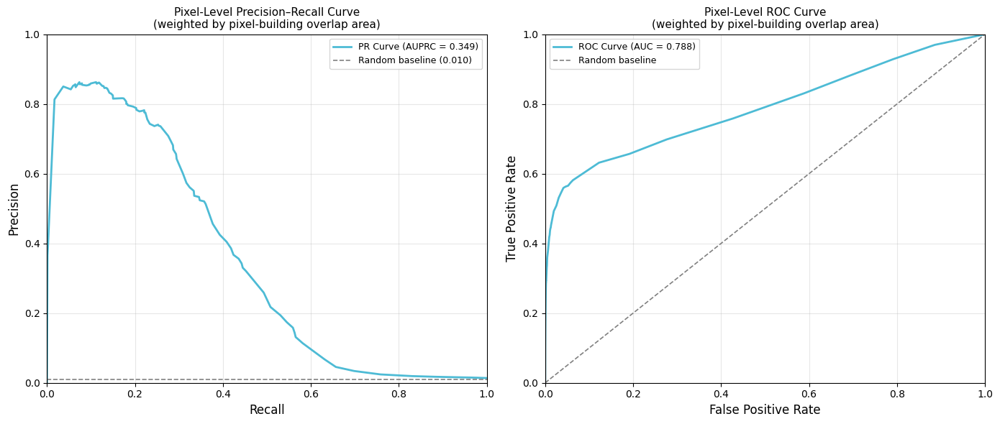

In [24]:
#  Pixel-level PR and ROC curves 
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
pos_rate_px = nrows_px / (nrows_px + nrows_sample_px)

# PR curve
axes[0].plot(pr_px['recall'], pr_px['precision'],
             color='#4DBBD5', lw=2, label=f'PR Curve (AUPRC = {pr_auc_px:.3f})')
axes[0].axhline(pos_rate_px, color='grey', ls='--', lw=1.2, label=f'Random baseline ({pos_rate_px:.3f})')
axes[0].set_xlabel('Recall', fontsize=12); axes[0].set_ylabel('Precision', fontsize=12)
axes[0].set_title('Pixel-Level Precision–Recall Curve\n(weighted by pixel-building overlap area)', fontsize=11)
axes[0].set_xlim(0,1); axes[0].set_ylim(0,1)
axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

# ROC curve
axes[1].plot(roc_px['fpr'], roc_px['tpr'],
             color='#4DBBD5', lw=2, label=f'ROC Curve (AUC = {roc_auc_px:.3f})')
axes[1].plot([0,1],[0,1], color='grey', ls='--', lw=1.2, label='Random baseline')
axes[1].set_xlabel('False Positive Rate', fontsize=12); axes[1].set_ylabel('True Positive Rate', fontsize=12)
axes[1].set_title('Pixel-Level ROC Curve\n(weighted by pixel-building overlap area)', fontsize=11)
axes[1].set_xlim(0,1); axes[1].set_ylim(0,1)
axes[1].legend(fontsize=9); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR,'performance',f'{path_label}_curves_pixels.png'), dpi=150)
plt.show()

## Building-Level Performance Analysis

In [25]:
building_area = bf_ov_raw[['building_id']].copy()
try:
    import gzip, struct

    def _shoelace_from_wkb(wkb_bytes):
        try:
            b = wkb_bytes
            if not isinstance(b, (bytes, bytearray)):
                return np.nan
            order_byte = b[0]
            fmt = '<' if order_byte == 1 else '>'
            n_pts = struct.unpack_from(fmt + 'I', b, 9)[0]
            coords = np.frombuffer(b, dtype=fmt + 'f8', count=n_pts * 2, offset=13)
            xy = coords.reshape(n_pts, 2)
            x, y = xy[:, 0], xy[:, 1]
            n = len(x)
            return float(abs(np.dot(x[:n-1], y[1:n]) - np.dot(x[1:n], y[:n-1])) / 2)
        except Exception:
            return np.nan

    import pyreadr as _pr2
    _bf_ov_raw = _pr2.read_r(BF_OV_PATH)[None].reset_index(drop=True)
    _bf_ov_raw['building_id'] = np.arange(1, len(_bf_ov_raw) + 1)

    if 'geometry' in _bf_ov_raw.columns:
        _areas = _bf_ov_raw['geometry'].apply(_shoelace_from_wkb)
        building_area = pd.DataFrame({'building_id': _bf_ov_raw['building_id'], 'area': _areas})
        print(f'Area from WKB geometry: {_areas.notna().sum():,}/{len(_areas):,} valid')
    else:
        raise ValueError('No geometry column')
    del _bf_ov_raw
except Exception as _e:
    print(f'WKB area failed ({_e}), using pixel-weight proxy')
    pix_count = (pixel_alignment_df_overlaps
                 .groupby('building_id')['weight'].sum()
                 .reset_index().rename(columns={'weight': 'pix_sum'}))
    building_area = bf_ov_raw[['building_id']].copy()
    building_area = building_area.merge(pix_count, on='building_id', how='left')
    building_area['area'] = building_area['pix_sum'].fillna(0) * 100
    building_area = building_area[['building_id', 'area']]

print(f'Building area table:  {building_area.shape}')
print(building_area.describe())

WKB area failed (Invalid file, or file has unsupported features), using pixel-weight proxy
Building area table:  (10984, 2)
        building_id          area
count  10984.000000  10984.000000
mean    5492.500000    259.525395
std     3170.952013    724.040700
min        1.000000      0.000000
25%     2746.750000     78.999998
50%     5492.500000    113.999997
75%     8238.250000    189.999996
max    10984.000000  41700.999068


In [26]:
bf_bldg = bf_ov_raw[['building_id','Dam2']].copy()

pix_ov = (
    pixel_alignment_df_overlaps
    .merge(bf_bldg, on='building_id', how='left')
    .dropna(subset=['weight'])
)
pix_ov_agg = (
    pix_ov
    .groupby(['r','c','building_id'])
    .agg(weight=('weight','sum'), Damage=('Dam2','min'))
    .reset_index()
)

print(f'pix_ov_agg: {pix_ov_agg.shape}')
print(f'Unique buildings: {pix_ov_agg["building_id"].nunique():,}')
print(f'Destroyed building pixels (Damage==1): {(pix_ov_agg["Damage"]==1).sum():,}')

tp2 = coh_perf[coh_perf['time_point']==2][['r','c','id']].drop_duplicates()
helper_df = (
    pix_ov_agg
    .merge(tp2, on=['r','c'], how='inner')
    [['r','c','id','building_id','weight']]
)

all_tps = coh_perf['time_point'].unique()
building_coherence_df = (
    helper_df.assign(key=1)
    .merge(pd.DataFrame({'time_point': all_tps, 'key':1}), on='key')
    .drop(columns='key')
    .merge(coh_perf[['r','c','time_point','prob_res_qn']], on=['r','c','time_point'], how='left')
)
print(f'building_coherence_df: {building_coherence_df.shape}')
gc.collect()

pix_ov_agg: (74726, 5)
Unique buildings: 10,964
Destroyed building pixels (Damage==1): 470
building_coherence_df: (1569246, 7)


10

In [27]:
def hmp_row(grp):
    return harmonic_mean_pvalue(grp['prob_res_qn'].values, grp['weight'].values)

comb_p_value = (
    building_coherence_df
    .groupby(['building_id','time_point'])
    .apply(hmp_row, include_groups=False)
    .rename('p_value_mean')
    .reset_index()
)

damage_per_bldg = (
    pix_ov_agg
    .groupby('building_id')
    .agg(Damage=('Damage','mean'), weight=('weight','sum'))
    .reset_index()
)

comb_p_value = (
    comb_p_value
    .merge(damage_per_bldg, on='building_id', how='left')
    .merge(building_area,   on='building_id', how='left')
)

comb_p_value.to_parquet(
    os.path.join(RESULTS_DIR,'performance_datasets',f'{path_label}_comb_p_value.parquet'))
print(f'comb_p_value: {comb_p_value.shape}')
print(f'Buildings with Damage label:  {comb_p_value["Damage"].notna().nunique()} unique building_ids')
print(f'Buildings with Destroyed (1): {(comb_p_value["Damage"]==1).nunique()} unique building_ids')
print(comb_p_value.head())

comb_p_value: (230244, 6)
Buildings with Damage label:  2 unique building_ids
Buildings with Destroyed (1): 2 unique building_ids
   building_id  time_point  p_value_mean  Damage     weight         area
0            1         2.0      0.603717     3.0  31.819999  3181.999929
1            1         3.0      0.419136     3.0  31.819999  3181.999929
2            1         4.0      0.654093     3.0  31.819999  3181.999929
3            1         5.0      0.113200     3.0  31.819999  3181.999929
4            1         6.0      0.000051     3.0  31.819999  3181.999929


In [28]:
MIN_AREA = 10 #from reference

damaged_df_bldg = (
    comb_p_value
    .dropna(subset=['Damage'])
    .query('13 <= time_point <= 18')
    .query('area >= @MIN_AREA')
    .groupby('building_id')
    .agg(p_value_mean=('p_value_mean', 'min'),
         Damage=('Damage', 'mean'),
         weight=('weight', 'mean'),
         area=('area', 'mean'))
    .reset_index()
    .query('Damage <= 1')
    .copy()
)
damaged_df_bldg['time_point'] = 13 

# t<12 from reference
to_sample_bldg = (
    comb_p_value
    .query('time_point < 12 and time_point != 6 and area >= @MIN_AREA')
    [['time_point', 'building_id', 'p_value_mean', 'Damage', 'weight', 'area']].copy()
)  

nrows_b = len(damaged_df_bldg)
nrows_sample_b = int((nrows_b - 0.01 * nrows_b) / 0.01)

print(f' Positive buildings (destroyed, aggregated across war): {nrows_b:,} (Should be 93)')
print(f' Negative sample per iteration (99:1): {nrows_sample_b:,}')
print(f' Negative pool size: {len(to_sample_bldg):,}')

prob_threshold_list_bldg = sorted(set(
    [1.01]
    + [i * 10**(-j) for j in range(1,31) for i in range(1,11)]
    + [1e-40,1e-50,1e-60,1e-70,1e-80,1e-90,1e-100,
       1e-110,1e-120,1e-130,1e-140,1e-150,
       1e-160,1e-170,1e-180,1e-190,1e-200,0.0]
), reverse=True)
print(f'Building threshold count: {len(prob_threshold_list_bldg)}')

 Positive buildings (destroyed, aggregated across war): 93 (Should be 93)
 Negative sample per iteration (99:1): 9,207
 Negative pool size: 76,629
Building threshold count: 298


In [29]:
def run_bldg_iter(i, pos_df, neg_df, n_neg, thresholds):
    replace   = n_neg > len(neg_df)
    sample_df = neg_df.sample(n=n_neg, replace=replace, random_state=122+i)
    rel_df    = pd.concat([pos_df, sample_df], ignore_index=True)
    rel_df['Damage'] = rel_df['Damage'].fillna(99)
    rows = []
    for thr in thresholds:
        d = rel_df.copy()
        d['pred'] = (d['p_value_mean'] < thr).astype(int)
        d['true'] = (d['Damage'] <= 1).astype(int)
        r = dict(
            true_pos  = int(((d.pred==1)&(d.true==1)).sum()),
            false_pos = int(((d.pred==1)&(d.true==0)).sum()),
            true_neg  = int(((d.pred==0)&(d.true==0)).sum()),
            false_neg = int(((d.pred==0)&(d.true==1)).sum()),
            threshold = thr, counter = i
        )
        rows.append(r)
    df = pd.DataFrame(rows).astype(float)
    df['precision'] = np.where(df.true_pos+df.false_pos>0, df.true_pos/(df.true_pos+df.false_pos), 0)
    df['recall']    = np.where(df.true_pos+df.false_neg>0, df.true_pos/(df.true_pos+df.false_neg), 0)
    df['f1']        = np.where(df.precision+df.recall>0, 2*df.precision*df.recall/(df.precision+df.recall), 0)
    df['fpr']       = np.where(df.false_pos+df.true_neg>0, df.false_pos/(df.false_pos+df.true_neg), 0)
    df['tpr']       = df['recall']
    return df

print('Running 100 building sampling iterations (parallelised)...')
bldg_results = Parallel(n_jobs=-1, verbose=5)(
    delayed(run_bldg_iter)(i, damaged_df_bldg, to_sample_bldg,
                            nrows_sample_b, prob_threshold_list_bldg)
    for i in range(1, 101)
)
df_results_bldg_full = pd.concat(bldg_results, ignore_index=True)
df_results_bldg_full.to_parquet(
    os.path.join(RESULTS_DIR,'performance_datasets',
                 f'{path_label}_df_results_buildings_random_draw.parquet'))
print(f'Done. Shape: {df_results_bldg_full.shape}')

Running 100 building sampling iterations (parallelised)...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   18.8s


Done. Shape: (29800, 11)


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   29.0s finished


In [30]:
df_bldg = (
    df_results_bldg_full
    .groupby('threshold')
    .agg(['mean','std'])
    .reset_index()
)
df_bldg.columns = ['_'.join(c).strip('_') for c in df_bldg.columns]

best_row_b              = df_bldg.loc[df_bldg['f1_mean'].idxmax()]
best_threshold_mariupol = best_row_b['threshold']
print(f'Best building F1:  {best_row_b["f1_mean"]:.4f} ± {best_row_b["f1_std"]:.4f}')
print(f'Best threshold:    {best_threshold_mariupol:.3e}')

plotting_bldg = df_bldg.rename(columns={
    'f1_mean':'f1','recall_mean':'recall','precision_mean':'precision',
    'fpr_mean':'fpr','tpr_mean':'tpr'
})
pr_bldg  = pr_envelope(plotting_bldg)
roc_bldg = roc_envelope(plotting_bldg)

pr_auc_bldg  = calc_auc(pr_bldg['recall'].values,  pr_bldg['precision'].values)
roc_auc_bldg = calc_auc(roc_bldg['fpr'].values, roc_bldg['tpr'].values)

print(f'Building AUPRC:    {pr_auc_bldg:.4f}')
print(f'Building ROC-AUC:  {roc_auc_bldg:.4f}')

pd.DataFrame({'pr_auc':[pr_auc_bldg],'roc_auc':[roc_auc_bldg]}).to_csv(
    os.path.join(RESULTS_DIR,'performance',f'{path_label}_performance_buildings.csv'), index=False)

Best building F1:  0.4571 ± 0.0183
Best threshold:    2.000e-05
Building AUPRC:    0.3767
Building ROC-AUC:  0.7636


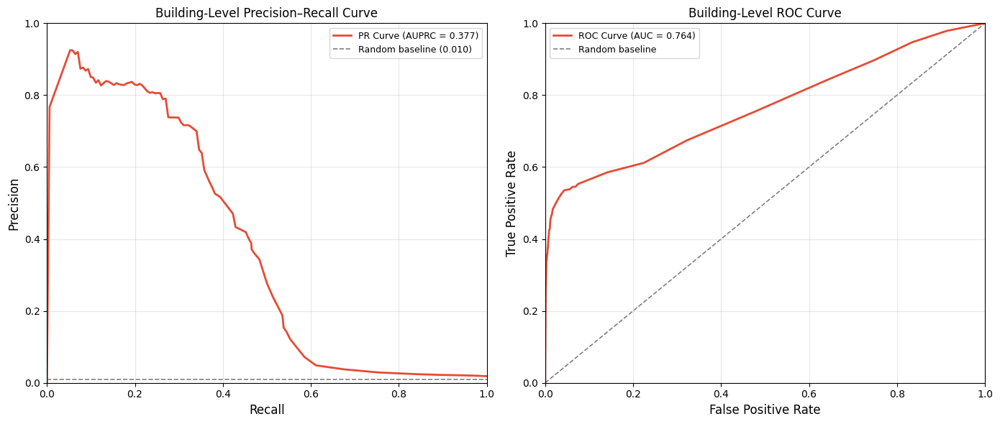

In [31]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
pos_rate_b = nrows_b / (nrows_b + nrows_sample_b)

axes[0].plot(pr_bldg['recall'], pr_bldg['precision'],
             color='#E64B35', lw=2, label=f'PR Curve (AUPRC = {pr_auc_bldg:.3f})')
axes[0].axhline(pos_rate_b, color='grey', ls='--', lw=1.2, label=f'Random baseline ({pos_rate_b:.3f})')
axes[0].set_xlabel('Recall', fontsize=12); axes[0].set_ylabel('Precision', fontsize=12)
axes[0].set_title('Building-Level Precision–Recall Curve', fontsize=12)
axes[0].set_xlim(0,1); axes[0].set_ylim(0,1)
axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

axes[1].plot(roc_bldg['fpr'], roc_bldg['tpr'],
             color='#E64B35', lw=2, label=f'ROC Curve (AUC = {roc_auc_bldg:.3f})')
axes[1].plot([0,1],[0,1], color='grey', ls='--', lw=1.2, label='Random baseline')
axes[1].set_xlabel('False Positive Rate', fontsize=12); axes[1].set_ylabel('True Positive Rate', fontsize=12)
axes[1].set_title('Building-Level ROC Curve', fontsize=12)
axes[1].set_xlim(0,1); axes[1].set_ylim(0,1)
axes[1].legend(fontsize=9); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR,'performance',f'{path_label}_curves_buildings.png'), dpi=150)
plt.show()

## Script 04 — Visualize Maps

In [32]:
full_viz = full_coherence_df_reg.copy()

if 'id' not in full_viz.columns:
    full_viz = full_viz.sort_values(['c','r','time_point'])
    full_viz['id'] = full_viz.groupby(['c','r']).ngroup() + 1

full_viz = full_viz.merge(pix_align_agg, on=['r','c'], how='left')

qn_viz = (
    full_viz.dropna(subset=['res'])
    .groupby('id')['res'].apply(qn_scale).rename('qn_sd').reset_index()
)
full_viz = full_viz.merge(qn_viz, on='id', how='left')
full_viz['p_value_qn'] = norm.cdf(full_viz['res'], loc=0, scale=full_viz['qn_sd'])

# Standardized residuals clipped to [1%, 99%]
sr = full_viz['res'] / full_viz['qn_sd']
q01, q99 = sr.quantile(0.01), sr.quantile(0.99)
full_viz['standardized_res_qn'] = sr.clip(q01, q99)

full_viz['outlier_mariupol'] = (full_viz['p_value_qn'] < best_threshold_mariupol).astype(float)
best_threshold_beirut = best_threshold_px  
full_viz['outlier_beirut'] = (full_viz['p_value_qn'] < best_threshold_beirut).astype(float)

print(f'full_viz shape: {full_viz.shape}')
print(f'Columns: {list(full_viz.columns)}')

comb_p_value_viz = comb_p_value.copy()
comb_p_value_viz['outlier_building_mariupol'] = (
    (comb_p_value_viz['p_value_mean'] < best_threshold_mariupol).astype(int)
)
comb_p_value_viz['outlier_building_beirut'] = (
    (comb_p_value_viz['p_value_mean'] < best_threshold_beirut).astype(int)
)
print(f'\nBuilding classification (mariupol threshold) per time_point:')
print(comb_p_value_viz.groupby('time_point')['outlier_building_mariupol'].mean().round(3).to_string())

full_viz shape: (4535307, 16)
Columns: ['r', 'c', 'value', 'time_point', 'id', 'dif_value', 'pred', 'res', 'sd', 'weight', 'Damage', 'qn_sd', 'p_value_qn', 'standardized_res_qn', 'outlier_mariupol', 'outlier_beirut']

Building classification (mariupol threshold) per time_point:
time_point
2.0     0.001
3.0     0.000
4.0     0.000
5.0     0.002
6.0     0.061
9.0     0.015
10.0    0.001
11.0    0.000
12.0    0.001
13.0    0.071
14.0    0.133
15.0    0.017
16.0    0.004
17.0    0.003
18.0    0.001
19.0    0.004
20.0    0.001
21.0    0.002
22.0    0.001
23.0    0.002
24.0    0.002


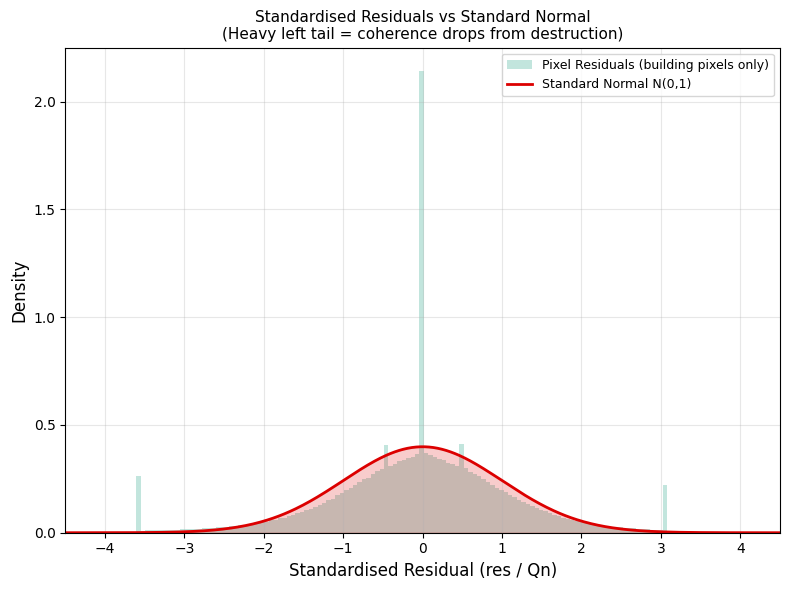

In [33]:
from scipy.stats import norm as scipy_norm

bldg_mask = full_viz['weight'].notna()
data_vals  = full_viz.loc[bldg_mask, 'standardized_res_qn'].dropna()

fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(data_vals, bins=120, density=True, alpha=0.55,
        color='#91D1C2', label='Pixel Residuals (building pixels only)')

xs   = np.linspace(-4.5, 4.5, 500)
npdf = scipy_norm.pdf(xs, 0, 1)
ax.fill_between(xs, 0, npdf, alpha=0.2, color='#DC0000')
ax.plot(xs, npdf, color='#DC0000', lw=2, label='Standard Normal N(0,1)')

ax.set_xlim(-4.5, 4.5); ax.set_xticks(range(-4,5))
ax.set_xlabel('Standardised Residual (res / Qn)', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
ax.set_title('Standardised Residuals vs Standard Normal\n'
             '(Heavy left tail = coherence drops from destruction)', fontsize=11)
ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR,'density_plots',
                         f'{path_label}_standardized_res.png'), dpi=150)
plt.show()

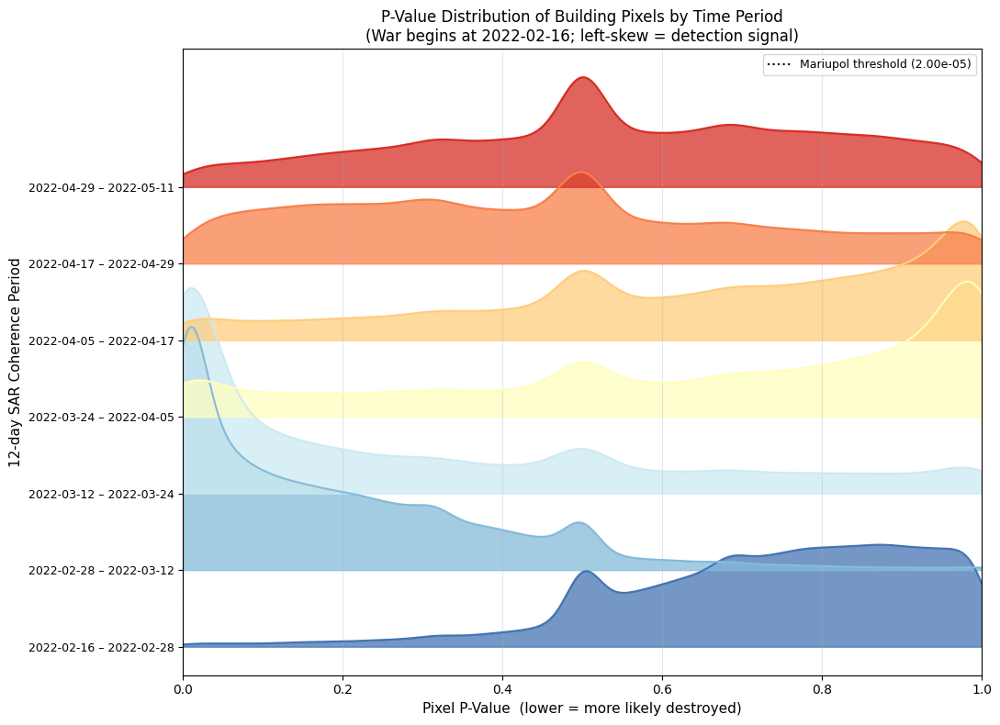

In [34]:
time_range   = list(range(12, 19))   # tp 12-18
colors_ridge = plt.cm.RdYlBu_r(np.linspace(0.1, 0.9, len(time_range)))

fig, ax = plt.subplots(figsize=(11, 8))
y_pos, y_labs = [], []
bldg_pix_viz = full_viz[full_viz['weight'].notna()].copy()

for idx, tp in enumerate(time_range):
    sub = bldg_pix_viz[bldg_pix_viz['time_point']==tp]['p_value_qn'].dropna()
    if len(sub) < 5:
        continue
    xs = np.linspace(0, 1, 500)
    try:
        kde = gaussian_kde(sub, bw_method='scott')
        ys  = kde(xs) * 0.65 + idx
    except Exception:
        continue

    row = dates_df[dates_df['time_point']==tp]
    label = row['label'].values[0] if len(row) else str(tp)

    ax.fill_between(xs, idx, ys, alpha=0.75, color=colors_ridge[idx])
    ax.plot(xs, ys, color=colors_ridge[idx], lw=1.5)
    y_pos.append(idx); y_labs.append(label)

ax.set_yticks(y_pos); ax.set_yticklabels(y_labs, fontsize=9)
ax.axvline(x=best_threshold_mariupol, color='black', ls=':', lw=1.5,
           label=f'Mariupol threshold ({best_threshold_mariupol:.2e})')
ax.set_xlabel('Pixel P-Value  (lower = more likely destroyed)', fontsize=11)
ax.set_ylabel('12-day SAR Coherence Period', fontsize=11)
ax.set_title('P-Value Distribution of Building Pixels by Time Period\n'
             '(War begins at 2022-02-16; left-skew = detection signal)', fontsize=12)
ax.set_xlim(0,1); ax.legend(fontsize=9); ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR,'density_plots',
                         f'{path_label}_ridge_pvalue.png'), dpi=150)
plt.show()

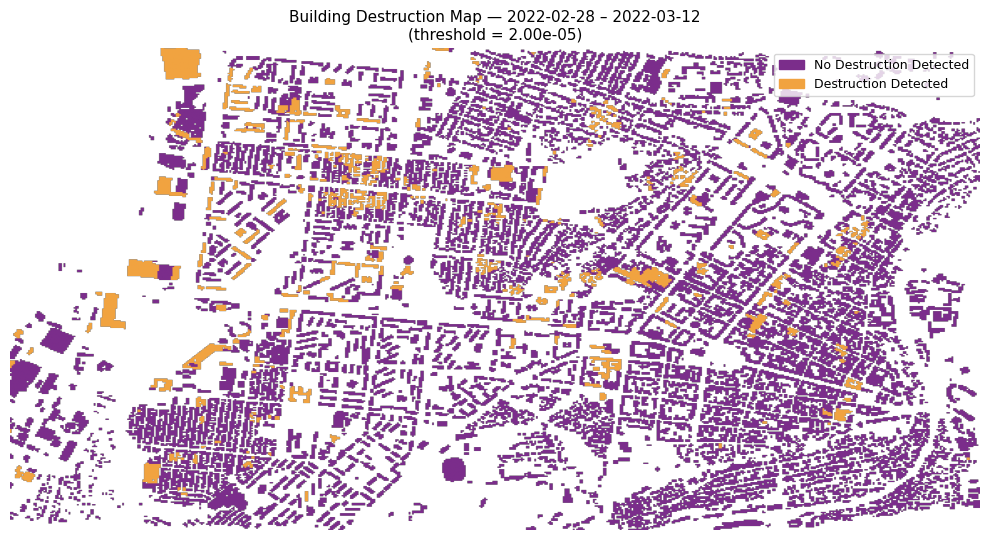

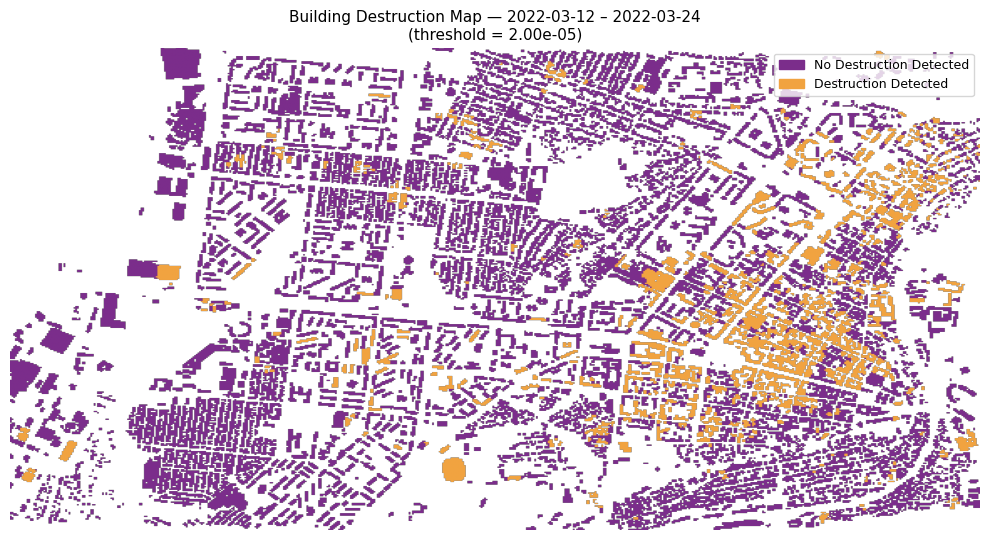

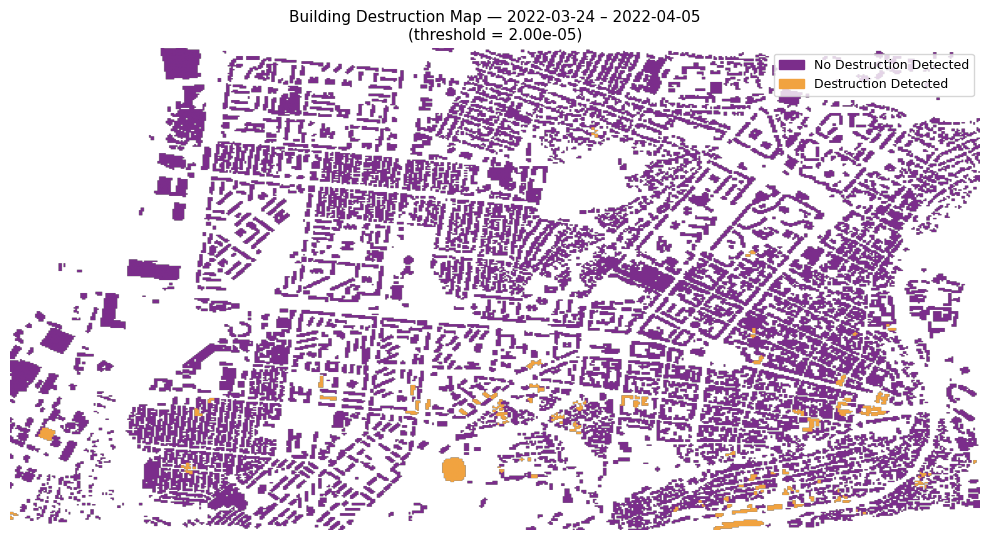

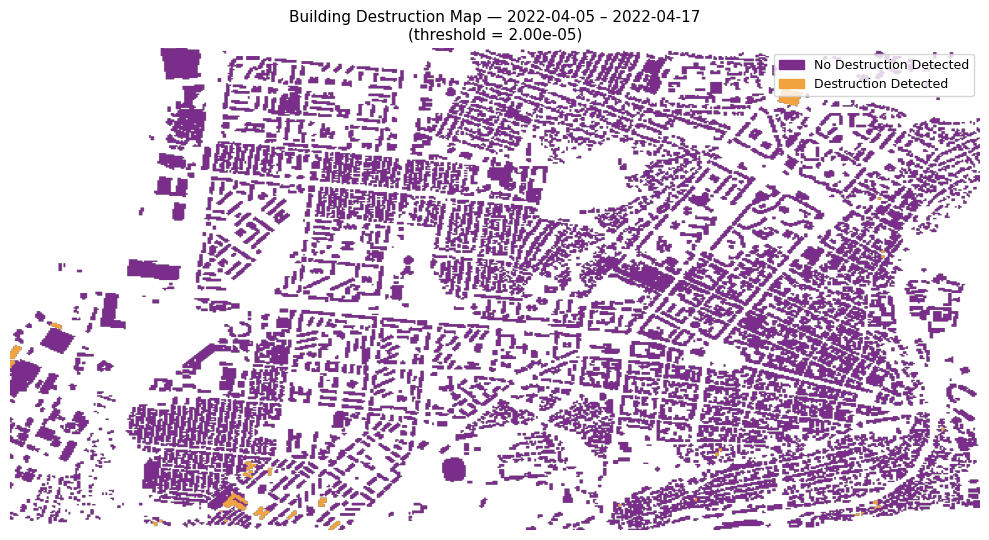

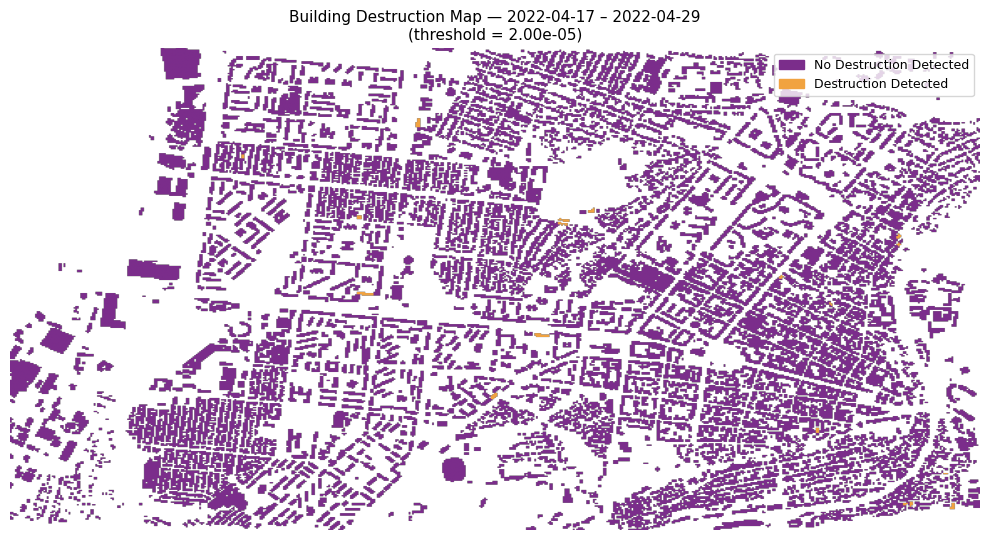

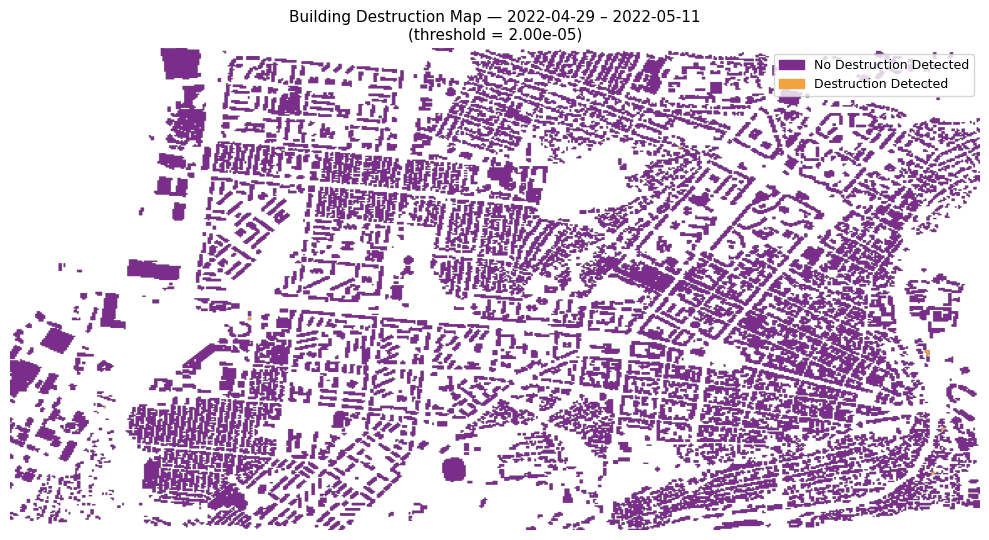

 Building classification maps saved (tp 13-18).


In [35]:
#  Spatial maps the war-period maps (tp 13-18)

os.makedirs(os.path.join(RESULTS_DIR,'spatial_maps',path_label,'outlier_building_mariupol'),
            exist_ok=True)

max_r = int(full_viz['r'].max())
max_c = int(full_viz['c'].max())

cmap_bin = mcolors.ListedColormap(['#7B2D8B','#F1A340'])   # purple=no dest, orange=dest
norm_bin = mcolors.BoundaryNorm([-0.5, 0.5, 1.5], cmap_bin.N)

for tp in range(13, 19):
    cur = comb_p_value_viz[comb_p_value_viz['time_point']==tp]
    if cur.empty: continue

    pix_cls = (
        pix_ov_agg
        .merge(cur[['building_id','outlier_building_mariupol']], on='building_id', how='left')
        .groupby(['r','c']).agg(outlier=('outlier_building_mariupol','max')).reset_index()
        .dropna(subset=['outlier'])
    )

    grid = np.full((max_r, max_c), np.nan)
    ri = pix_cls['r'].astype(int).values - 1
    ci = pix_cls['c'].astype(int).values - 1
    vm = (ri>=0)&(ri<max_r)&(ci>=0)&(ci<max_c)
    grid[ri[vm], ci[vm]] = pix_cls['outlier'].values[vm]

    date_lbl = dates_df[dates_df['time_point']==tp]['label'].values
    date_lbl = date_lbl[0] if len(date_lbl) else str(tp)

    fig, ax = plt.subplots(figsize=(10, 5.5))
    ax.imshow(grid, cmap=cmap_bin, norm=norm_bin, aspect='auto', origin='upper')
    patches = [mpatches.Patch(color='#7B2D8B', label='No Destruction Detected'),
               mpatches.Patch(color='#F1A340', label='Destruction Detected')]
    ax.legend(handles=patches, loc='upper right', fontsize=9)
    ax.set_title(f'Building Destruction Map — {date_lbl}\n'
                 f'(threshold = {best_threshold_mariupol:.2e})', fontsize=11)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR,'spatial_maps',path_label,
                             'outlier_building_mariupol',f'{tp}.png'), dpi=150, bbox_inches='tight')
    plt.show()
    plt.close()

print(' Building classification maps saved (tp 13-18).')

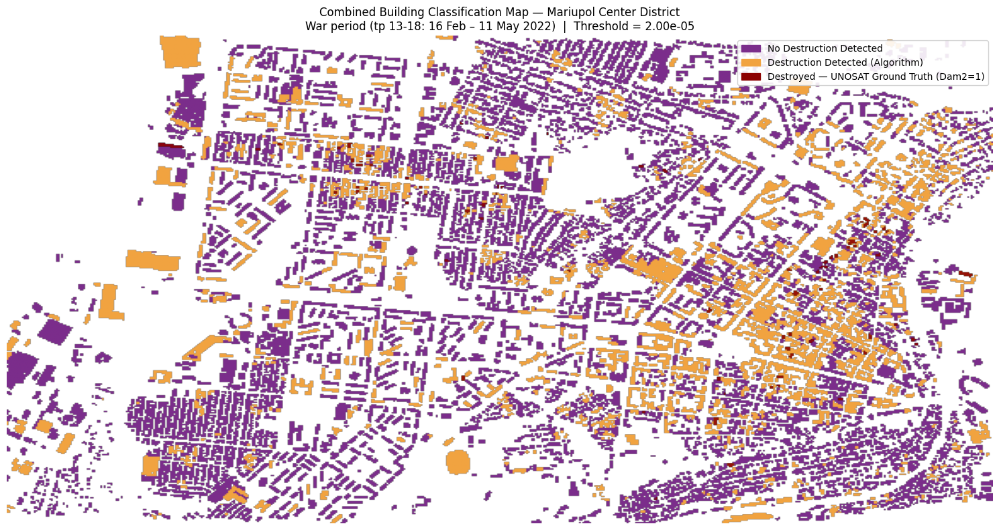

  Combined classification map saved.


In [36]:
#  Combined classification map 


combined_cls = (
    comb_p_value_viz[comb_p_value_viz['time_point'].isin(range(13,19))]
    .groupby('building_id')['outlier_building_mariupol'].max().reset_index()
)

pix_combined = (
    pix_ov_agg
    .merge(combined_cls, on='building_id', how='left')
    .groupby(['r','c'])
    .agg(outlier=('outlier_building_mariupol','max'), Damage=('Damage','min'))
    .reset_index()
)

grid_cls = np.full((max_r, max_c), np.nan)
grid_dmg = np.full((max_r, max_c), np.nan)
pc  = pix_combined.dropna(subset=['outlier'])
ri  = pc['r'].astype(int).values - 1
ci  = pc['c'].astype(int).values - 1
vm  = (ri>=0)&(ri<max_r)&(ci>=0)&(ci<max_c)
grid_cls[ri[vm], ci[vm]] = pc['outlier'].values[vm]
grid_dmg[ri[vm], ci[vm]] = pc['Damage'].values[vm]

fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(grid_cls, cmap=cmap_bin, norm=norm_bin, aspect='auto', origin='upper')

# Overlay: UNOSAT destroyed buildings as dark red
gt_overlay = np.zeros((*grid_cls.shape, 4), dtype=float)
destroyed_mask = (~np.isnan(grid_cls)) & (grid_dmg <= 1)
gt_overlay[destroyed_mask] = [0.55, 0.0, 0.0, 0.9]
ax.imshow(gt_overlay, aspect='auto', origin='upper')

patches = [
    mpatches.Patch(color='#7B2D8B', label='No Destruction Detected'),
    mpatches.Patch(color='#F1A340', label='Destruction Detected (Algorithm)'),
    mpatches.Patch(color=(0.55,0,0), label='Destroyed — UNOSAT Ground Truth (Dam2=1)'),
]
ax.legend(handles=patches, loc='upper right', fontsize=10, framealpha=0.9)
ax.set_title('Combined Building Classification Map — Mariupol Center District\n'
             f'War period (tp 13-18: 16 Feb – 11 May 2022)  |  Threshold = {best_threshold_mariupol:.2e}',
             fontsize=12)
ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR,'combined_spatial_maps',
                         f'{path_label}_combined_labels.png'), dpi=150, bbox_inches='tight')
plt.show()
print('  Combined classification map saved.')

In [37]:
#  Final Performance Summary 
print('\n')
print('  MARIUPOL DESTRUCTION DETECTION — FINAL PERFORMANCE SUMMARY')
print('Dataset:  Mariupol Center District, Ukraine')
print('Conflict: Russia–Ukraine War (full-scale invasion: 24 Feb 2022)')
print(f'Method:   SAR Coherence Change Detection (lambda={LAMBDA})')
print('PIXEL-LEVEL  (area-weighted, 99:1 sampling)')
print(f'  AUPRC:            {pr_auc_px:.4f}')
print(f'  ROC-AUC:          {roc_auc_px:.4f}')
print(f'  Best F1 (weighted): {best_px["f1_weighted_mean"]:.4f} ± {best_px["f1_weighted_std"]:.4f}')
print(f'  N destroyed pixels: {nrows_px:,}')
print(f'  Best threshold:   {best_threshold_px:.3e}')
print('BUILDING-LEVEL  (99:1 sampling)')
print(f'  AUPRC:            {pr_auc_bldg:.4f}')
print(f'  ROC-AUC:          {roc_auc_bldg:.4f}')
print(f'  Best F1:          {best_row_b["f1_mean"]:.4f} ± {best_row_b["f1_std"]:.4f}')
print(f'  N destroyed bldgs:{nrows_b:,}')
print(f'  Best threshold:   {best_threshold_mariupol:.3e}')
print('  Expected from paper (Räcke & Keil 2024):')
print('    Pixel ROC-AUC  ≈ 0.94   Building AUPRC ≈ 0.61')
print('='*65)



  MARIUPOL DESTRUCTION DETECTION — FINAL PERFORMANCE SUMMARY
Dataset:  Mariupol Center District, Ukraine
Conflict: Russia–Ukraine War (full-scale invasion: 24 Feb 2022)
Method:   SAR Coherence Change Detection (lambda=10)
PIXEL-LEVEL  (area-weighted, 99:1 sampling)
  AUPRC:            0.3485
  ROC-AUC:          0.7882
  Best F1 (weighted): 0.4236 ± 0.0104
  N destroyed pixels: 456
  Best threshold:   9.000e-04
BUILDING-LEVEL  (99:1 sampling)
  AUPRC:            0.3767
  ROC-AUC:          0.7636
  Best F1:          0.4571 ± 0.0183
  N destroyed bldgs:93
  Best threshold:   2.000e-05
  Expected from paper (Räcke & Keil 2024):
    Pixel ROC-AUC  ≈ 0.94   Building AUPRC ≈ 0.61
